In [1]:
import pandas as pd
from bifacial_peak_shaving import *
from utils import *
pd.options.plotting.backend='plotly'

# Data

In [2]:
dir = './Data/'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2017-01-01 00:00:00 to 2017-12-31 23:00:00
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  8760 non-null   float64
dtypes: float64(1)
memory usage: 136.9 KB
None
         Load (kW)
count  8760.000000
mean    563.939533
std     136.510414
min      12.293981
25%     497.277205
50%     617.636693
75%     651.366556
max     748.835175


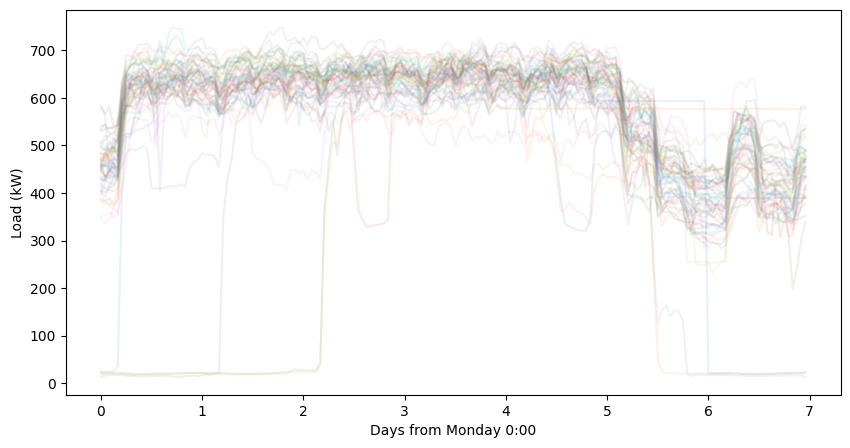

In [16]:
load = pd.read_csv(dir+'Impianto_4_all_cleaned.csv',
                   index_col=0,
                   parse_dates=True,
                   comment='#').loc['2017']
load.columns = ['Load (kW)']
load['Load (kW)'] = load['Load (kW)'] * 1000
print(load.info())
print(load.describe())

plot_weekly(load['Load (kW)'],alpha=0.1)

load.plot()

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [17]:
solar_angles = ['s20','w20','w90','s20w90']
solar = pd.concat(( 
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_s20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w90deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_3.5kwp_s20deg_3.5kwp_w90deg.csv',index_col=0),
                   ),
                  axis=1)
solar.index = pd.date_range('1900-1-1 0:00',periods=8760,freq='1h')
solar.columns = solar_angles
net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()/7) # load=production / yield
solar = solar * net_zero_capacity/7 # scale to net 0
#solar = solar * 2 # randomly scale up
solar.describe()

,s20,w20,w90,s20w90
count,8760.000000,8760.000000,8760.000000,8760.000000
mean,563.939533,504.125689,539.337653,552.096489
std,796.217950,711.521811,709.004453,703.126541
min,-1.961965,-1.961965,-1.788061,-1.640979
25%,-0.232089,-0.232089,-0.232089,-0.232089
50%,-0.232089,-0.232089,-0.232089,-0.232089
75%,1115.065680,988.315096,1038.765954,1190.008857
max,3217.579518,3099.879563,2716.567412,2499.879793


In [18]:
# for col in solar:
#     plot_daily(solar[col],title=col,interval_min=60)

## Plot weekly

In [19]:
solar.index = load.index
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]
df    

,load,solar_s20,solar_w20,solar_w90,solar_s20w90,netload_s20,netload_w20,netload_w90,netload_s20w90
Datetime,,,,,,,,,
2017-01-01 00:00:00,21.270578,-0.232089,-0.232089,-0.232089,-0.232089,21.502666,21.502666,21.502666,21.502666
2017-01-01 01:00:00,21.270578,-0.232089,-0.232089,-0.232089,-0.232089,21.502666,21.502666,21.502666,21.502666
2017-01-01 02:00:00,21.481415,-0.232089,-0.232089,-0.232089,-0.232089,21.713504,21.713504,21.713504,21.713504
2017-01-01 03:00:00,21.741657,-0.232089,-0.232089,-0.232089,-0.232089,21.973745,21.973745,21.973745,21.973745
2017-01-01 04:00:00,21.790017,-0.232089,-0.232089,-0.232089,-0.232089,22.022106,22.022106,22.022106,22.022106
...,...,...,...,...,...,...,...,...,...
2017-12-31 19:00:00,577.357170,-0.232089,-0.232089,-0.232089,-0.232089,577.589259,577.589259,577.589259,577.589259
2017-12-31 20:00:00,577.357170,-0.232089,-0.232089,-0.232089,-0.232089,577.589259,577.589259,577.589259,577.589259
2017-12-31 21:00:00,577.357170,-0.232089,-0.232089,-0.232089,-0.232089,577.589259,577.589259,577.589259,577.589259


load v s20

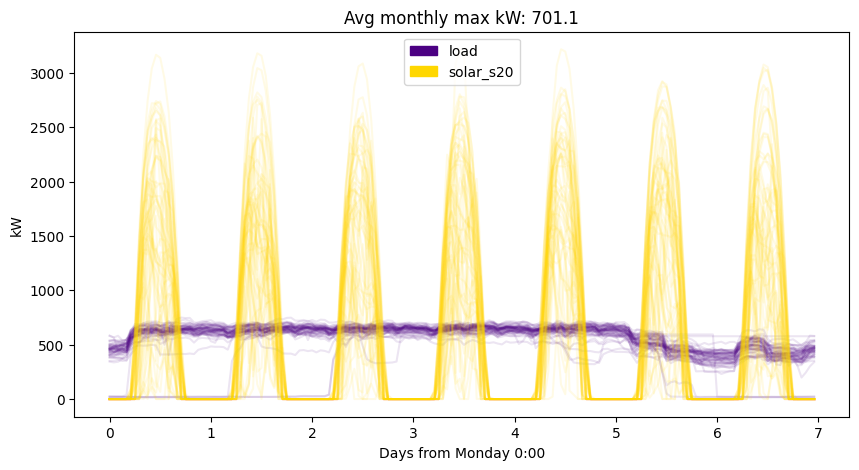

In [20]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

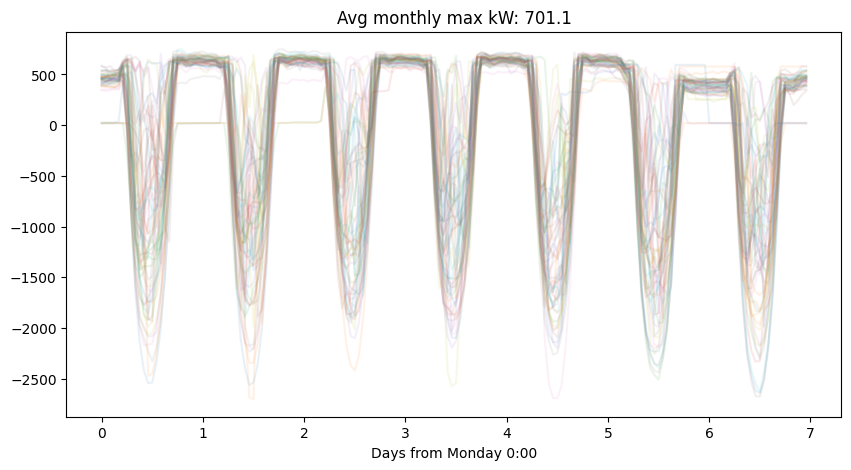

In [21]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

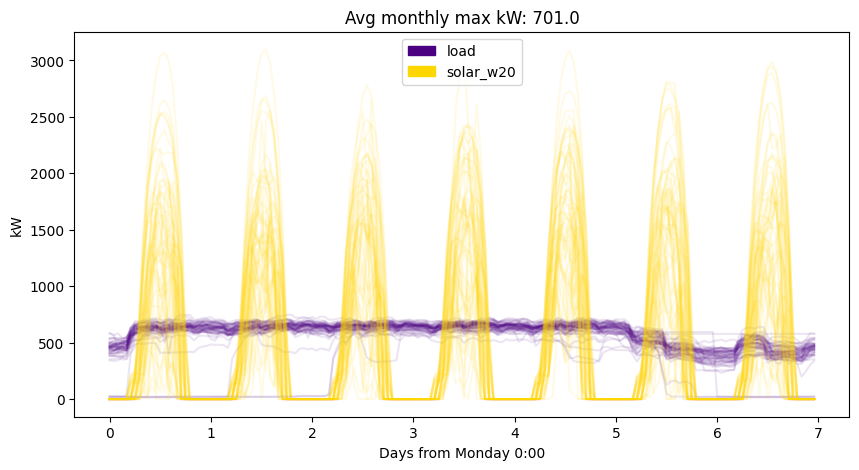

In [22]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

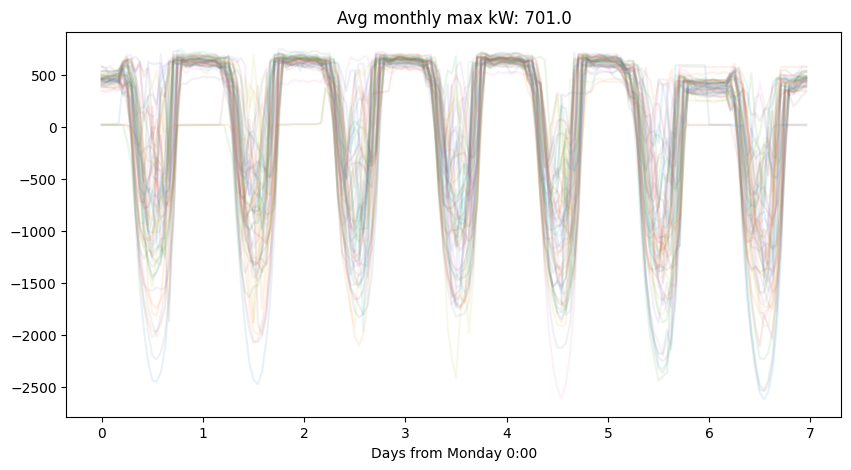

In [23]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

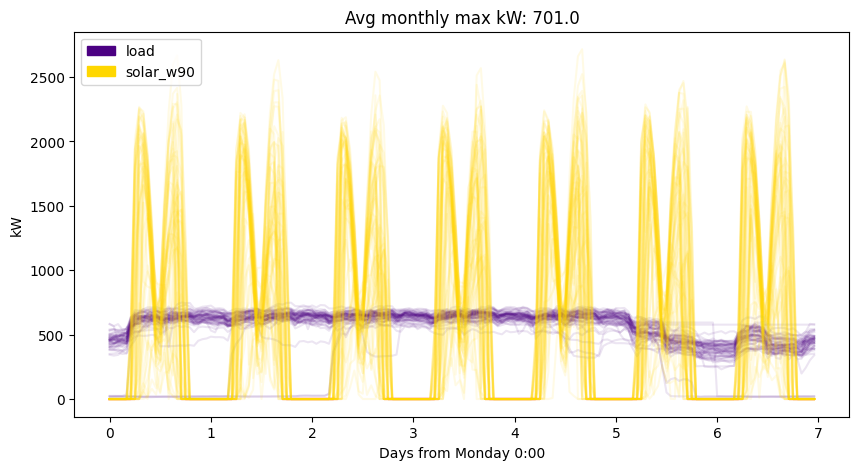

In [24]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

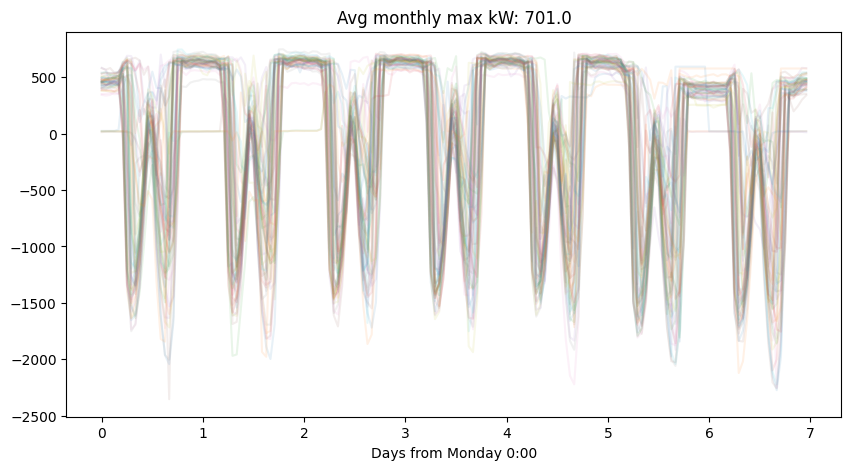

In [25]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

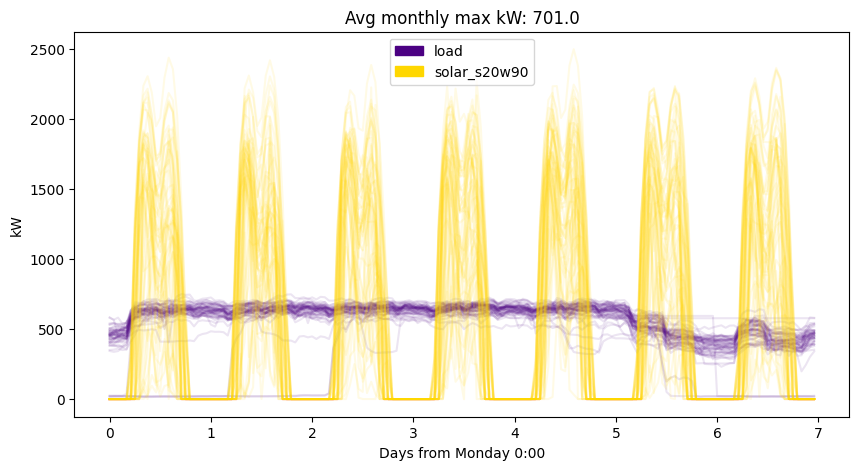

In [26]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

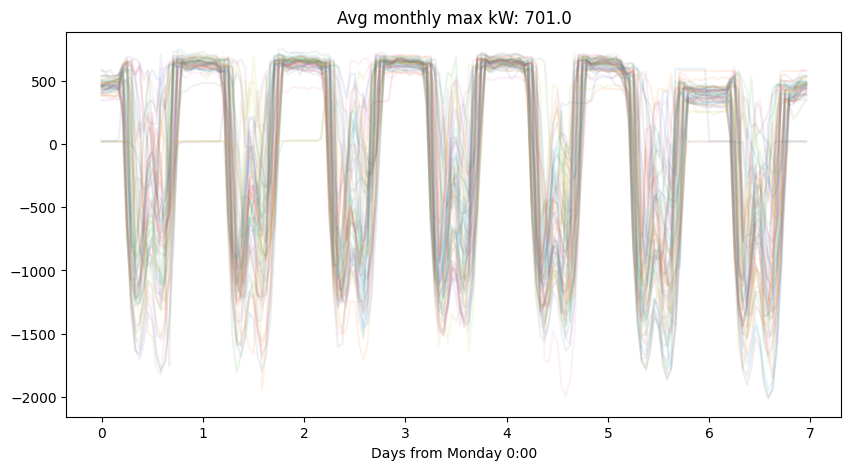

In [27]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Monthly peaks

## Single TOU

In [28]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

angle = 'w20'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w20 reduction 72.05833333333334
Avg w90 reduction 119.675
Avg s20w90 reduction 81.69166666666665


,netload_s20 kw,netload_s20 t,netload_w20 kw,netload_w20 t,netload_s20->w20 reduc kw,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
1,675.4,2017-01-20 08:00:00,675.4,2017-01-20 08:00:00,0.0,676.6,2017-01-31 09:00:00,-1.2,675.4,2017-01-20 08:00:00,0.0
2,672.8,2017-02-06 08:00:00,672.8,2017-02-06 08:00:00,0.0,672.8,2017-02-06 08:00:00,0.0,672.8,2017-02-06 08:00:00,0.0
3,461.9,2017-03-09 08:00:00,462.8,2017-03-09 08:00:00,-0.9,508.3,2017-03-09 08:00:00,-46.4,485.1,2017-03-09 08:00:00,-23.2
4,549.8,2017-04-13 08:00:00,549.8,2017-04-13 08:00:00,0.0,576.4,2017-04-13 08:00:00,-26.6,563.1,2017-04-13 08:00:00,-13.3
5,312.0,2017-05-17 08:00:00,314.4,2017-05-17 08:00:00,-2.4,371.8,2017-05-17 08:00:00,-59.8,341.9,2017-05-17 08:00:00,-29.9
6,-193.7,2017-06-14 10:00:00,-251.0,2017-06-28 08:00:00,57.3,-128.5,2017-06-28 10:00:00,-65.2,-237.7,2017-06-27 10:00:00,44.0
7,653.4,2017-07-05 10:00:00,540.0,2017-07-05 10:00:00,113.4,-38.9,2017-07-05 10:00:00,692.3,315.3,2017-07-05 10:00:00,338.1
8,507.0,2017-08-24 10:00:00,164.2,2017-08-21 09:00:00,342.8,209.4,2017-08-21 09:00:00,297.6,176.5,2017-08-21 09:00:00,330.5
9,472.4,2017-09-25 10:00:00,117.9,2017-09-28 08:00:00,354.5,-187.1,2017-09-28 10:00:00,659.5,131.3,2017-09-25 10:00:00,341.1
10,621.4,2017-10-30 09:00:00,621.4,2017-10-30 09:00:00,0.0,621.4,2017-10-30 09:00:00,0.0,621.4,2017-10-30 09:00:00,0.0


## Variable TOU

w20

In [29]:
angle1 = 's20'
angle2 = 'w20'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
1,8,11,354.5,72.1,-2.4
2,8,12,360.5,59.6,-2.4
3,8,13,191.6,25.4,-2.4
4,8,14,110.3,2.9,-74.8
5,8,15,110.3,3.1,-74.8
...,...,...,...,...,...
72,17,19,202.8,22.1,0.0
73,17,20,27.0,2.6,0.0
74,17,21,27.0,2.6,0.0
75,18,20,27.0,2.6,0.0


w90

In [30]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,488.3,69.6,-65.9
1,8,11,692.3,119.7,-65.2
2,8,12,259.8,2.5,-336.9
3,8,13,218.9,7.0,-210.0
4,8,14,218.9,7.0,-210.0
5,8,15,218.9,6.9,-210.0
6,8,16,218.9,8.1,-210.0
7,8,17,218.9,11.1,-210.0
9,8,19,152.2,14.8,0.0
10,8,20,4.5,0.4,0.0


s20w90

In [31]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,450.7,63.0,-33.0
1,8,11,341.1,81.7,-29.9
2,8,12,151.3,8.5,-104.2
3,8,13,119.3,10.4,-29.9
4,8,14,119.3,10.4,-29.9
...,...,...,...,...,...
72,17,19,215.8,23.2,0.0
73,17,20,27.0,2.6,0.0
74,17,21,27.0,2.6,0.0
75,18,20,27.0,2.6,0.0


Best for w90

In [32]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [33]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [34]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

## Technical

More or less technical peak shaving doesn't benefit from bifacial, I think because if you're trying to shave the entire day you benefit more from the greater kWh produced by s20 than any of the other angles.

### Single angle

In [ ]:
angle = 's20'
threshold = 100
batt_kwh_max = 50
tou_h = list(range(24))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

### Several angles

In [ ]:
threshold = 100
batt_kwh_max = 100
TOU_hours = list(range(24))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            TOU_hours)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

s20

In [ ]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [ ]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

## Economic

### Single angle

In [37]:
threshold = 0
batt_kwh_max = 5000
angle = 's20'
tou_h = list(range(16,21))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,step=10)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Failed on first battery size, try 1.1x
Failed on first battery size, try 2x
Failed on first battery size, try 5x
Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 11280.0,


### Several angles

In [38]:
threshold = 0
batt_kwh_max = 12000
tou_h = list(range(16,21))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            tou_h,
                                            step=100)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 11300.0,
Failed on first battery size, try 1.1x
Failed on first battery size, try 2x
Solution found: netload_w20, Threshold kw = 0.0, Battery kWh = 16400.0,
Failed on first battery size, try 1.1x
Failed on first battery size, try 2x
Solution found: netload_w90, Threshold kw = 0.0, Battery kWh = 14900.0,
Failed on first battery size, try 1.1x
Solution found: netload_s20w90, Threshold kw = 0.0, Battery kWh = 12700.0,


,batt_kwh,dispatch
s20,11300,load solar_s20 so...
w20,16400,load solar_s20 so...
w90,14900,load solar_s20 so...
s20w90,12700,load solar_s20 so...


s20

In [40]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [41]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')